By imposing a parameterised greybody function on the SPIRE fluxes, I am essentialy constraining the colour space. 

In [1]:
import pylab as plt
import seaborn as sns
import numpy as np
import pystan
%matplotlib notebook


/usr/local/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [201]:
model_code="""
data
{
    int nsrc;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;

}




parameters {
  real<lower=0.0,upper=1E5> Nbb[nsrc];
  real<lower=10, upper=100.0> T[nsrc];
  real<lower=1.0,upper=2.0> Beta[nsrc];
  real<lower=1.4,upper=2.6> alpha[nsrc];
  real<lower=0.001,upper=5> z[nsrc];
}

transformed parameters {
  vector[nsrc] f_vec_psw;//vector of source fluxes
  vector[nsrc] f_vec_pmw;//vector of source fluxes
  vector[nsrc] f_vec_plw;//vector of source fluxes
  vector[nsrc] L_dust;


  for (i in 1:nsrc){

    f_vec_psw[i]=SPIRE_obs_no_filt(Nbb[i],alpha[i],Beta[i],T[i],z[i],c,h,k_B,250.0)*1E-3;
    f_vec_pmw[i]=SPIRE_obs_no_filt(Nbb[i],alpha[i],Beta[i],T[i],z[i],c,h,k_B,350.0)*1E-3;
    f_vec_plw[i]=SPIRE_obs_no_filt(Nbb[i],alpha[i],Beta[i],T[i],z[i],c,h,k_B,500.0)*1E-3;
    L_dust[i]=log10(1.0E-23*LIR(Nbb[i],alpha[i],Beta[i],T[i],c,h,k_B)/3.826E33);
}

}
model {
    10.0~normal(L_dust,3);
}
generated quantities {
  vector[nsrc] s_vec_psw;//vector of source fluxes
  vector[nsrc] s_vec_pmw;//vector of source fluxes
  vector[nsrc] s_vec_plw;//vector of source fluxes

    for (i in 1:nsrc){
    s_vec_psw[i]=normal_rng(f_vec_psw[i],0.1*f_vec_psw[i]);
    s_vec_pmw[i]=normal_rng(f_vec_pmw[i],0.1*f_vec_pmw[i]);
    s_vec_plw[i]=normal_rng(f_vec_plw[i],0.1*f_vec_plw[i]);

}}
"""
    
    


In [202]:

concat = ''.join([open('/Users/pdh21/HELP/XID_plus/stan_models/FIR_module.stan').read(),model_code])


In [203]:
sm = pystan.StanModel(model_code=concat)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_5ace025cead73cba1c376bb8d8a23cf1 NOW.


In [204]:
data={'nsrc':10}

In [205]:
fit=sm.sampling(data=data,iter=500)

In [206]:
fit

Inference for Stan model: anon_model_5ace025cead73cba1c376bb8d8a23cf1.
4 chains, each with iter=500; warmup=250; thin=1; 
post-warmup draws per chain=250, total post-warmup draws=1000.

               mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
Nbb[0]        4.7e4  938.55  3.0e4 1646.3  2.1e4  4.7e4  7.4e4  9.7e4 1000.0    1.0
Nbb[1]        4.9e4  941.51  3.0e4 2043.9  2.2e4  5.0e4  7.4e4  9.8e4 1000.0    1.0
Nbb[2]        4.7e4  907.06  2.9e4 1940.4  2.2e4  4.6e4  7.2e4  9.7e4 1000.0    1.0
Nbb[3]        4.7e4  963.66  3.0e4 1379.3  1.9e4  4.6e4  7.5e4  9.8e4 1000.0    1.0
Nbb[4]        4.8e4  916.87  2.9e4 2018.4  2.3e4  4.6e4  7.4e4  9.8e4 1000.0    1.0
Nbb[5]        4.8e4  930.22  2.9e4 1990.0  2.2e4  4.6e4  7.4e4  9.7e4 1000.0    1.0
Nbb[6]        4.8e4  938.02  3.0e4 1767.6  2.1e4  4.7e4  7.3e4  9.7e4 1000.0    1.0
Nbb[7]        4.7e4  963.89  3.0e4 1411.3  1.9e4  4.7e4  7.4e4  9.7e4 1000.0    1.0
Nbb[8]        4.8e4  907.42  2.9e4 1676.8  2.2e4  4.8e4  7

In [210]:
samples=fit.extract()

<IPython.core.display.Javascript object>


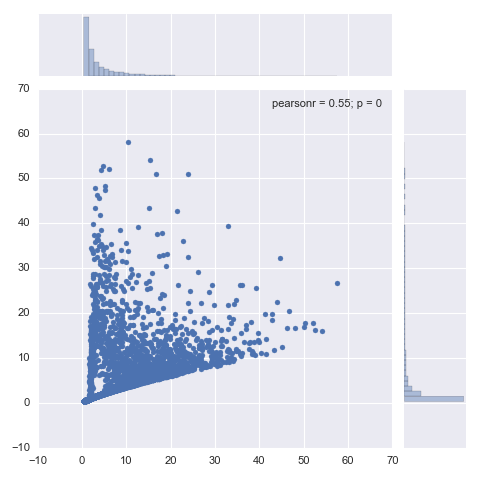

In [367]:
sns.jointplot(x=samples['f_vec_pmw'][:,0:10]/samples['f_vec_psw'][:,0:10],y=samples['f_vec_plw'][:,0:10]/samples['f_vec_pmw'][:,0:10])


<IPython.core.display.Javascript object>


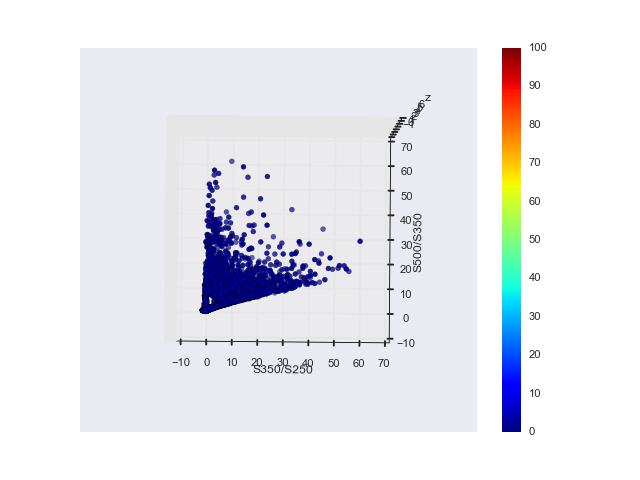

In [366]:


from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
s=ax.scatter(samples['f_vec_pmw'][:,0:10]/samples['f_vec_psw'][:,0:10], samples['f_vec_plw'][:,0:10]/samples['f_vec_pmw'][:,0:10],samples['z'][:,0:10],c=samples['T'][:,0:10],cmap=cm.jet,vmin=0,vmax=100)
ax.set_xlabel('S350/S250')
ax.set_ylabel('S500/S350')
ax.set_zlabel('z')
plt.colorbar(s)

<IPython.core.display.Javascript object>


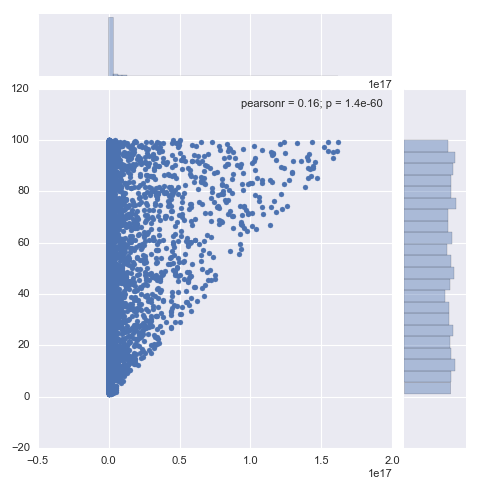

In [33]:

sns.jointplot(x=np.power(10.00,samples['L_dust'][:,0:10].reshape(-1)),y=samples['Nbb'][:,0:10].reshape(-1))

# What is the flux distribution?

<IPython.core.display.Javascript object>


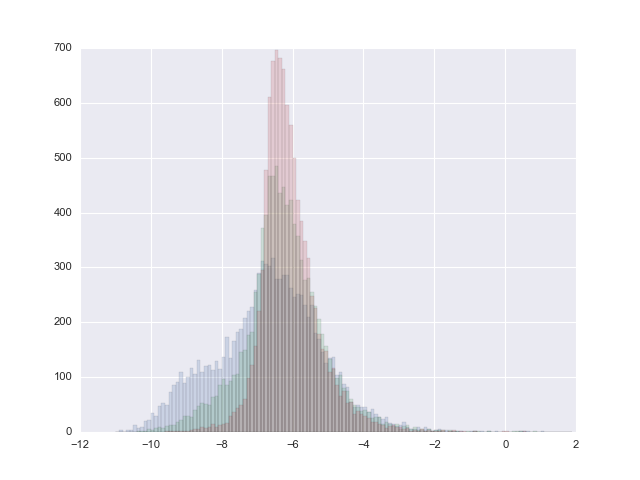

(array([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    0.,    0.,    0.,    0.,    1.,    1.,    1.,    2.,
           2.,    1.,    1.,    4.,    6.,    6.,    9.,    7.,   10.,
          15.,   10.,   12.,   15.,   17.,   29.,   37.,   43.,   49.,
          60.,   99.,  123.,  156.,  220.,  295.,  478.,  610.,  677.,
         697.,  681.,  661.,  597.,  560.,  499.,  423.,  385.,  349.,
         317.,  248.,  226.,  179.,  151.,  147.,  110.,  117.,   85.,
          66.,   74.,   52.,   55.,   32.,   39.,   33.,   29.,   26.,
          19.,   19.,   15.,   12.,    8.,   11.,   12.,   10.,   10.,
           5.,    7.,    2.,    4.,    2.,    5.,    2.,    4.,    1.,
           2.,    2.,    3.,    0.,    1.,    3.,    0.,    1.,    1.,
           0.,    0.,    1.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.,    1.,    2.,    0.,    0.,    0.,    0.,    1.,    0.,
           0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
      

In [365]:
fig = plt.figure()

plt.hist(np.log10(samples['f_vec_psw'][:,0:10].reshape(-1)), alpha=0.2,bins=np.arange(-11,2,0.1))
plt.hist(np.log10(samples['f_vec_pmw'][:,0:10].reshape(-1)), alpha=0.2,bins=np.arange(-11,2,0.1))
plt.hist(np.log10(samples['f_vec_plw'][:,0:10].reshape(-1)), alpha=0.2,bins=np.arange(-11,2,0.1))

<IPython.core.display.Javascript object>


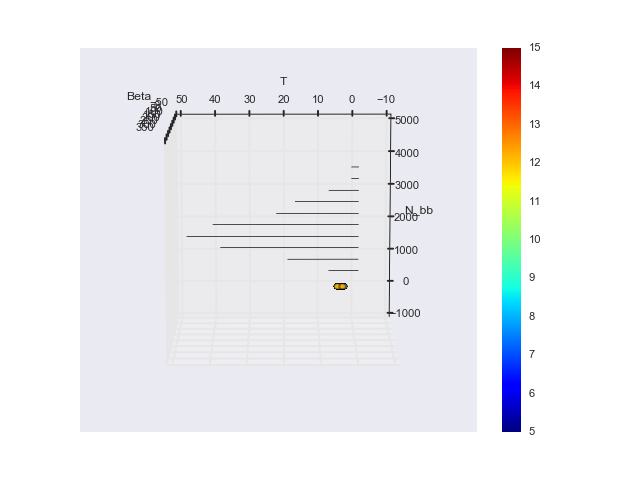

In [212]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
s=ax.scatter(np.log(samples['Nbb'][:,0:10]),np.log(samples['T'][:,0:10]),np.log(samples['Beta'][:,0:10]),c=samples['L_dust'][:,0:10],cmap=cm.jet,vmin=5,vmax=15)
ax.set_xlabel('N_bb')
ax.set_ylabel('T')
ax.set_zlabel('Beta')
plt.colorbar(s)

<IPython.core.display.Javascript object>


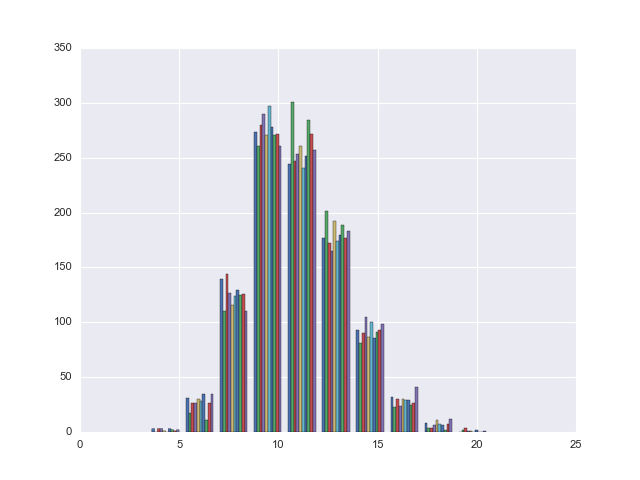

([array([   3.,   31.,  139.,  273.,  244.,  177.,   93.,   32.,    8.,    0.]),
  array([   0.,   17.,  110.,  261.,  301.,  201.,   81.,   23.,    4.,    2.]),
  array([   3.,   26.,  144.,  280.,  247.,  172.,   90.,   30.,    4.,    4.]),
  array([   3.,   26.,  127.,  290.,  253.,  165.,  105.,   24.,    6.,    1.]),
  array([   1.,   30.,  116.,  271.,  261.,  192.,   87.,   30.,   11.,    1.]),
  array([   0.,   28.,  124.,  297.,  241.,  174.,  100.,   29.,    7.,    0.]),
  array([   3.,   35.,  129.,  278.,  252.,  180.,   86.,   29.,    6.,    2.]),
  array([   2.,   11.,  125.,  271.,  284.,  189.,   91.,   25.,    2.,    0.]),
  array([   1.,   26.,  126.,  272.,  272.,  177.,   93.,   26.,    7.,    0.]),
  array([   2.,   35.,  110.,  261.,  257.,  183.,   98.,   41.,   12.,    1.])],
 array([  3.45003847,   5.16901575,   6.88799303,   8.6069703 ,
         10.32594758,  12.04492486,  13.76390214,  15.48287941,
         17.20185669,  18.92083397,  20.63981125]),
 <a list 

In [208]:
plt.figure()
plt.hist(samples['L_dust'][:,0:10])

In [12]:
sns.jointplot(x=samples['L_dust'][:,0:10].reshape(-1),y=samples['Nbb'][:,0:10].reshape(-1)/samples['T'][:,0:10].reshape(-1))

<IPython.core.display.Javascript object>

ZeroDivisionError: float division by zero

In [38]:
def Casey_SED(N_bb,T,beta,alpha,lam):
    b_1=26.68
    b_2=6.246
    b_3=1.905E-4
    b_4=7.243E-5
    k_B=1.3806488E-23
    c=3.0E8
    h=6.62606957E-34
    S_bb=N_bb*np.power(c/(1E-6*lam),beta+3)/(np.exp(h*c/((1E-6*lam)*k_B*T))-1)
    L_a_T=np.power((np.power(b_1+b_2*alpha,-2.0)+(b_3+b_4*alpha)*T),-1.0)
    lam_c=3.0*L_a_T/4.0
    #----Casey 2012 function in table not working------
    #N_pl=N_bb*(1-np.exp(-1.0*(lam_0/lam_c)**beta))*np.power(lam_c,-3.0)/(np.exp(h*c/(lam_c*k_B*T))-1)
    #------Use this instead-------------
    A1 =(c/(lam_c*1E-6))**(beta+3.0)
    A2 = np.exp((h*c)/(1.0E-6*lam_c*k_B*T))-1.0
    B = (lam_c)**alpha
    N_pl = N_bb*A1/(A2*B)
    S_pl=N_pl*np.power(lam,alpha)*np.exp(-1.0*np.power(lam/lam_c,2.0))
    return (S_bb+S_pl)

<IPython.core.display.Javascript object>


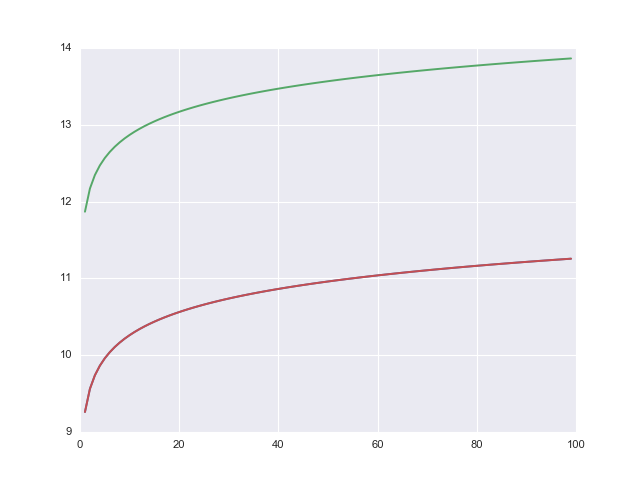

In [39]:
lam=np.arange(8,1000.0,1)
N_bb=2
T=20.0
beta=1.5
alpha=2.0
LIR=np.empty((100,2))
for i in np.arange(0,100,1):
    LIR[i,0]=np.log10(1.0E-23*np.trapz(Casey_SED(i,T,beta,alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)
    LIR[i,1]=np.log10(1.0E-23*np.trapz(Casey_SED(i,60,beta,alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)

plt.figure()
plt.plot(np.arange(0,100,1),LIR[:,0])
plt.plot(np.arange(0,100,1),LIR[:,1])
plt.plot(np.arange(0,100,1),np.log10(np.arange(0,100,1)*10.0**LIR[1,0]))

<IPython.core.display.Javascript object>


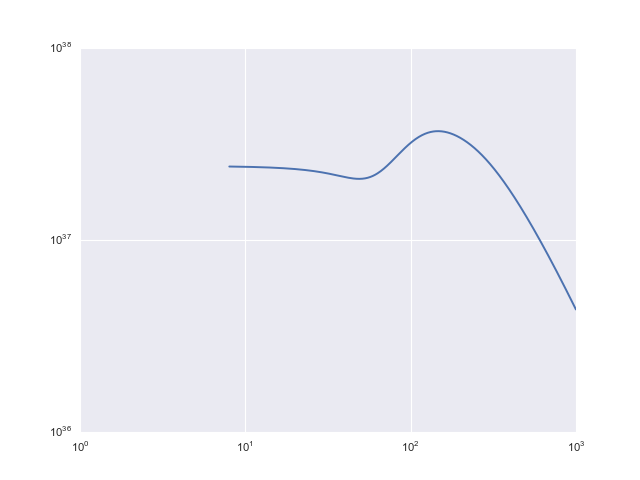

In [52]:
plt.loglog(lam,Casey_SED(i,30,0.0,0.0,lam))

<IPython.core.display.Javascript object>


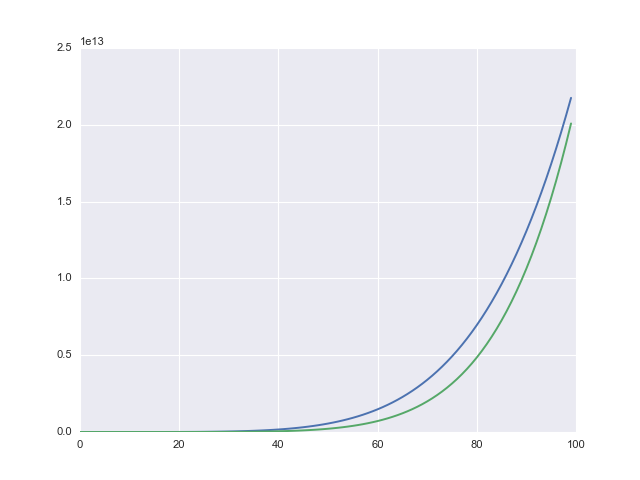

In [41]:
lam=np.arange(8,1000.0,1)
N_bb=2
T=20
beta=1.5
alpha=2.0
LIR=np.empty((100,2))
for i in np.arange(0,100,1):
    LIR[i,0]=np.log10(1.0E-23*np.trapz(Casey_SED(N_bb,i,beta,alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)
    LIR[i,1]=np.log10(1.0E-23*np.trapz(Casey_SED(N_bb,i,beta,alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)

plt.figure()
plt.plot(np.arange(0,100,1),10.0**LIR[:,0])
plt.plot(np.arange(0,100,1),np.arange(0,100,1)**)
#plt.plot(np.arange(0,100,1),np.log10(np.arange(0,100,1)*10.0**LIR[1,0]))

<IPython.core.display.Javascript object>


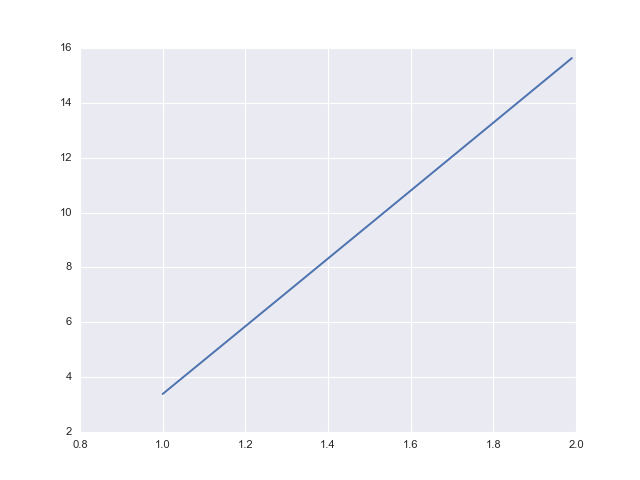

In [110]:
lam=np.arange(8,1000.0,1)
N_bb=2
T=20
beta=np.arange(1,2,0.01)
alpha=2.0
LIR=np.empty((100,2))
for i in np.arange(0,100,1):
    LIR[i,0]=np.log10(1.0E-23*np.trapz(Casey_SED(N_bb,T,beta[i],alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)
    LIR[i,1]=np.log10(1.0E-23*np.trapz(Casey_SED(N_bb,T,beta[i],alpha,lam)[::-1],x=3.0E14/lam[::-1])/3.826E33)

plt.figure()
plt.plot(beta,LIR[:,0])
#plt.plot(np.arange(0,100,1),)
#plt.plot(np.arange(0,100,1),np.log10(np.arange(0,100,1)*10.0**LIR[1,0]))

In [41]:
3.0E14/lam

array([  3.75000000e+13,   3.33333333e+13,   3.00000000e+13,
         2.72727273e+13,   2.50000000e+13,   2.30769231e+13,
         2.14285714e+13,   2.00000000e+13,   1.87500000e+13,
         1.76470588e+13,   1.66666667e+13,   1.57894737e+13,
         1.50000000e+13,   1.42857143e+13,   1.36363636e+13,
         1.30434783e+13,   1.25000000e+13,   1.20000000e+13,
         1.15384615e+13,   1.11111111e+13,   1.07142857e+13,
         1.03448276e+13,   1.00000000e+13,   9.67741935e+12,
         9.37500000e+12,   9.09090909e+12,   8.82352941e+12,
         8.57142857e+12,   8.33333333e+12,   8.10810811e+12,
         7.89473684e+12,   7.69230769e+12,   7.50000000e+12,
         7.31707317e+12,   7.14285714e+12,   6.97674419e+12,
         6.81818182e+12,   6.66666667e+12,   6.52173913e+12,
         6.38297872e+12,   6.25000000e+12,   6.12244898e+12,
         6.00000000e+12,   5.88235294e+12,   5.76923077e+12,
         5.66037736e+12,   5.55555556e+12,   5.45454545e+12,
         5.35714286e+12,

<IPython.core.display.Javascript object>


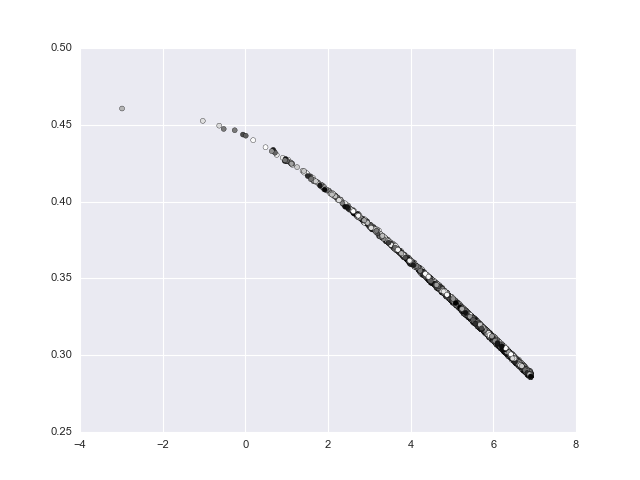

In [118]:
plt.scatter(np.log(samples['Nbb']),np.log(samples['Beta']), c=samples['T'])

<IPython.core.display.Javascript object>


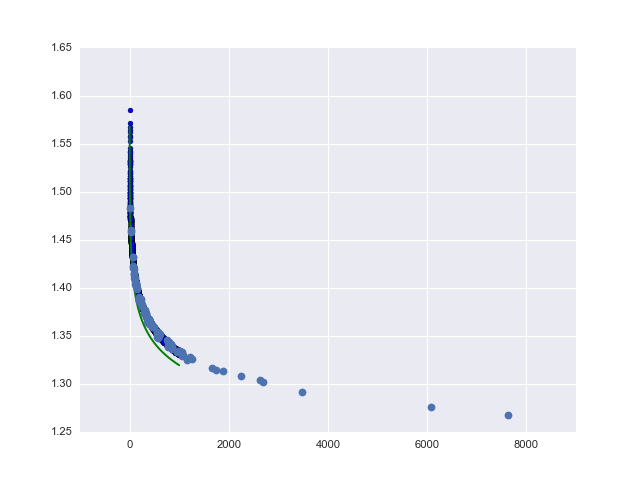

In [145]:
plt.scatter(samples['Nbb'],samples['Beta'],)
plt.plot(np.arange(0,1000),np.exp(0.45)*np.power(np.arange(0,1000.0),-0.025),'g')

In [146]:
point=np.random.multivariate_normal([np.mean(np.log(samples['Nbb'].reshape(-1))),np.mean(np.log(samples['Beta'].reshape(-1)))],np.cov(np.log(samples['Nbb'].reshape(-1)),np.log(samples['Beta'].reshape(-1))), size=100)                                                                                

In [147]:
point.shape
plt.plot(np.exp(point[:,0]),np.exp(point[:,1]),'o')

In [23]:
model_code="""
data
{
    int nsrc;
    vector[4] mu;
    vector[nsrc] L_dust;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;
  

}




parameters {
  vector<lower=-4,upper=4>[4] alpha[nsrc];
  real<lower=0.001,upper=5> z[nsrc];
  vector<lower=0>[4] S;
  cholesky_factor_corr[4] L;
}

transformed parameters {
  vector[4] beta[nsrc]; //N_bb,T,beta,alpha
  //vector[nsrc] L_dust;  
  
  


  for (i in 1:nsrc){
    beta[i] = exp(mu + S .* (L * alpha[i]));
    //L_dust[i]=log10(1.0E-23*LIR(beta[i][1],beta[i][4],beta[i][3],beta[i][2],c,h,k_B)/3.826E33);
}

}
model {
    for (i in 1:nsrc){
    alpha[i] ~ normal(0, 1);
    L_dust[i] ~ normal(log10(1.0E-23*LIR(beta[i][1],beta[i][4],beta[i][3],beta[i][2],c,h,k_B)/3.826E33),0.1);
}
L ~ lkj_corr_cholesky(1.0);
S ~ 
}
generated quantities {
  matrix[4,4] Omega;
  matrix[4,4] Sigma;
  Omega = multiply_lower_tri_self_transpose(L);
  Sigma = quad_form_diag(Omega, S); 
}
"""

In [356]:
model_code="""
data
{
    int nsrc;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;

}




parameters {
  real<lower=0,upper=8> Nbb[nsrc];
  real<lower=1.9,upper=4.9> T[nsrc];
  real<lower=0.17,upper=0.77> Beta[nsrc];
  real<lower=0.09,upper=1.29> alpha[nsrc];
  real<lower=0.001,upper=5> z[nsrc];
}

transformed parameters {
  vector[nsrc] f_vec_psw;//vector of source fluxes
  vector[nsrc] f_vec_pmw;//vector of source fluxes
  vector[nsrc] f_vec_plw;//vector of source fluxes
  vector[nsrc] L_dust;


  for (i in 1:nsrc){
    //print(exp(Nbb[i])," ",exp(alpha[i])," ",exp(Beta[i])," ",exp(T[i]))
    f_vec_psw[i]=SPIRE_obs_no_filt(exp(Nbb[i]),exp(alpha[i]),exp(Beta[i]),exp(T[i]),z[i],c,h,k_B,250.0)*1E-3;
    f_vec_pmw[i]=SPIRE_obs_no_filt(exp(Nbb[i]),exp(alpha[i]),exp(Beta[i]),exp(T[i]),z[i],c,h,k_B,350.0)*1E-3;
    f_vec_plw[i]=SPIRE_obs_no_filt(exp(Nbb[i]),exp(alpha[i]),exp(Beta[i]),exp(T[i]),z[i],c,h,k_B,500.0)*1E-3;
    L_dust[i]=log10(1.0E-23*LIR(exp(Nbb[i]),exp(alpha[i]),exp(Beta[i]),exp(T[i]),c,h,k_B)/3.826E33);
}

}
model {
    11.0~normal(L_dust,0.1);
    Nbb~normal(4.6,1.0);
    T~normal(3.4,0.5);
    Beta~normal(0.47,0.1);
    alpha~normal(0.69,0.2);
}
generated quantities {
  vector[nsrc] s_vec_psw;//vector of source fluxes
  vector[nsrc] s_vec_pmw;//vector of source fluxes
  vector[nsrc] s_vec_plw;//vector of source fluxes

    for (i in 1:nsrc){
    s_vec_psw[i]=normal_rng(f_vec_psw[i],0.1*f_vec_psw[i]);
    s_vec_pmw[i]=normal_rng(f_vec_pmw[i],0.1*f_vec_pmw[i]);
    s_vec_plw[i]=normal_rng(f_vec_plw[i],0.1*f_vec_plw[i]);

}}
"""
    
    


In [442]:
np.log(np.array([50.0,30.0,1.6,2.0]))

array([ 3.91202301,  3.40119738,  0.47000363,  0.69314718])

$P(N,T,\beta, \theta|D)\propto P(D|N,T,\beta)P(N,T,\beta|\theta)P(\theta)$


In [21]:
L_dust=np.random.uniform(low=6.0,high=15,size=100)

In [24]:
concat = ''.join([open('/Users/pdh21/HELP/XID_plus/stan_models/FIR_module.stan').read(),model_code])
sm = pystan.StanModel(model_code=concat)


INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_054c737bb029a83bdb0f5452ed264e61 NOW.


In [26]:
data={'nsrc':100, 
     'mu':[3.91,3.4,0.47,0.69],
     'L_dust':L_dust}
fit=sm.sampling(data=data,iter=500, init='random',)

In [ ]:
plt.figure()
plt.hist(np.exp(np.random.normal(np.log(100.0),1.0,200)), bins=np.arange(0,300,10))

In [27]:
fit

Inference for Stan model: anon_model_054c737bb029a83bdb0f5452ed264e61.
4 chains, each with iter=500; warmup=250; thin=1; 
post-warmup draws per chain=250, total post-warmup draws=1000.

              mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
alpha[0,0]   -1.77    0.44   0.76  -2.66  -2.63   -2.1  -1.25  -0.19    3.0   2.24
alpha[1,0]    -1.2    0.64    0.9  -2.05  -2.04  -2.01  -0.31   0.38    2.0   2.92
alpha[2,0]   -1.23    0.37   0.65  -2.07  -2.05  -0.99  -0.97   0.39    3.0   1.63
alpha[3,0]   -1.12    0.68   0.96  -2.48  -2.47  -0.83  -0.26   0.12    2.0   2.47
alpha[4,0]    0.09    1.02   1.44   -2.6  -0.56  -0.32   1.67   2.32    2.0   3.12
alpha[5,0]   -0.34    0.75   1.06  -1.64  -1.45  -0.42   1.03   1.36    2.0   2.81
alpha[6,0]   -0.93    1.15   1.62  -2.57  -2.56  -1.51   1.03   1.62    2.0   3.94
alpha[7,0]    0.82    0.57   0.81  -0.47   0.23   0.63   1.96   2.08    2.0   2.83
alpha[8,0]   -0.87    0.48   0.67  -1.86  -1.59  -0.94  -0.38   0.3

<IPython.core.display.Javascript object>


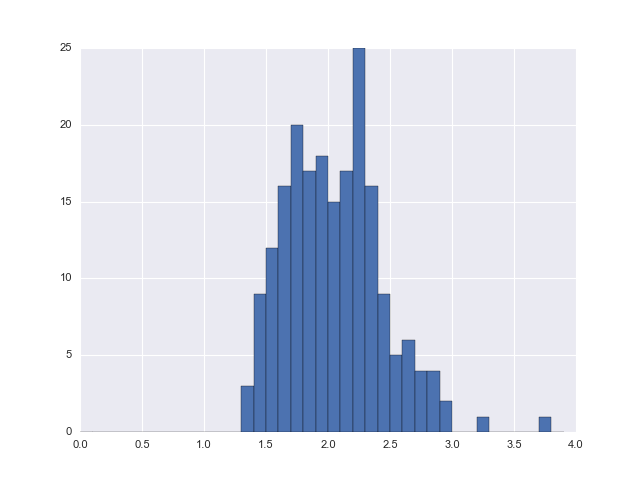

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   3.,   9.,  12.,  16.,  20.,  17.,  18.,  15.,  17.,
         25.,  16.,   9.,   5.,   6.,   4.,   4.,   2.,   0.,   0.,   1.,
          0.,   0.,   0.,   0.,   1.,   0.]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,
         1.1,  1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,
         2.2,  2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,
         3.3,  3.4,  3.5,  3.6,  3.7,  3.8,  3.9]),
 <a list of 39 Patch objects>)

In [319]:
plt.figure()
plt.hist(np.exp(np.random.normal(np.log(2),0.2,200)), bins=np.arange(0,4,0.1))

In [429]:
samples=fit.extract()

<IPython.core.display.Javascript object>


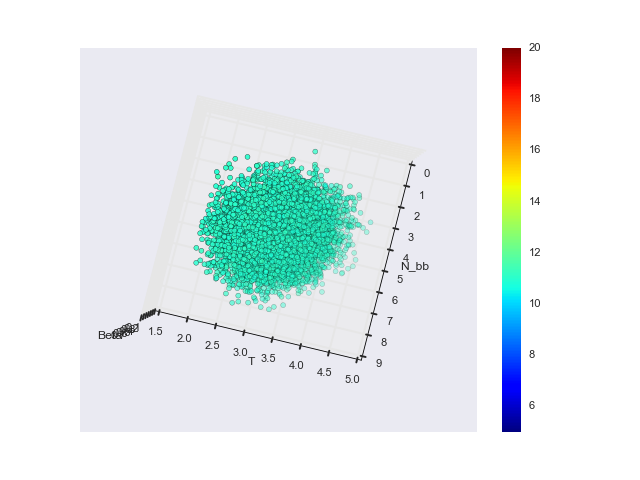

In [361]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
s=ax.scatter(samples['Nbb'][:,0:10],samples['T'][:,0:10],samples['Beta'][:,0:10],c=samples['L_dust'][:,0:10],cmap=cm.jet,vmin=5,vmax=20)
ax.set_xlabel('N_bb')
ax.set_ylabel('T')
ax.set_zlabel('Beta')
plt.colorbar(s)

<IPython.core.display.Javascript object>


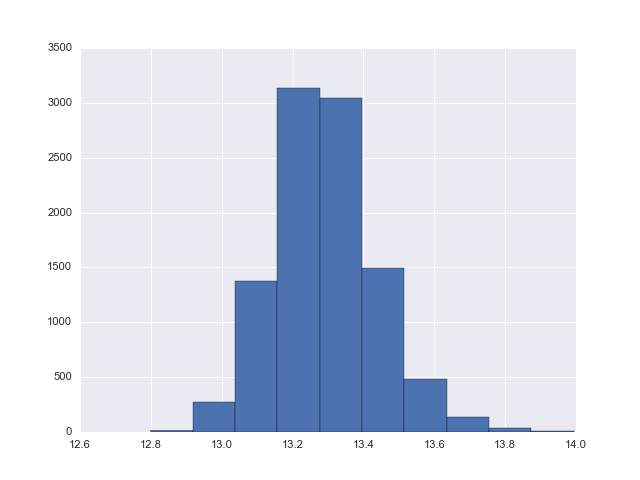

(array([   15.,   275.,  1372.,  3139.,  3045.,  1492.,   480.,   140.,
           32.,    10.]),
 array([ 12.79907506,  12.91848208,  13.03788909,  13.15729611,
         13.27670312,  13.39611013,  13.51551715,  13.63492416,
         13.75433118,  13.87373819,  13.9931452 ]),
 <a list of 10 Patch objects>)

In [441]:
plt.figure()
plt.hist(samples['L_dust'].reshape(-1))

In [393]:
Sigma=np.cov(np.vstack((samples['Nbb'].reshape(-1),samples['T'].reshape(-1),samples['Beta'].reshape(-1),samples['alpha'].reshape(-1))))

In [391]:
np.cov(samples['Nbb'].reshape(-1),samples['T'].reshape(-1))

array([[ 0.98247986, -0.05326405],
       [-0.05326405,  0.17646155]])

In [438]:
MBB=samples['alpha'].reshape((10000,4))

<IPython.core.display.Javascript object>


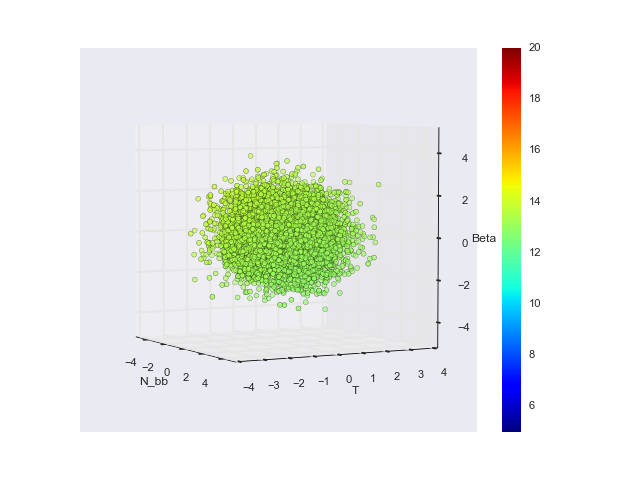

In [439]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
s=ax.scatter(MBB[:,0],MBB[:,1],MBB[:,2],c=samples['L_dust'][:,0:10],cmap=cm.jet,vmin=5,vmax=20)
ax.set_xlabel('N_bb')
ax.set_ylabel('T')
ax.set_zlabel('Beta')
plt.colorbar(s)

Things to check:

1. Distribution parameters when fitting to uniform sample of Luminosity
2. Distribution of fluxes when modelling with MBB distribution
3. Fit to Catalogue
4. Fit to map

## Fit to Catalogue

In [2]:
from astropy.table import Table

In [3]:
Lacy=Table.read('../../test_files/lacey_07012015_MillGas.ALLVOLS_cat_PSW_COSMOS_test.fits')

In [4]:
Lacy

DHALOID,GALAXYID,S100,S160,S250,S350,S500,APPUSO_TOT_EXT,APPGSO_TOT_EXT,APPRSO_TOT_EXT,APPISO_TOT_EXT,APPZSO_TOT_EXT,DEC,IS_CENTRAL,MHHALO,MSTARDOT,MSTARS_TOT,RA,Z_COS,Z_OBS
str22,str22,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float32,float32,float32,float32,float64,float32,float32
7221000005,250660000005,0.184557,0.847295,1.00324,0.666443,0.30983,21.0851,19.9199,19.3745,19.1446,18.9669,2.52281435887,0.0,1.12367e+11,8.41508e+07,1.02091e+09,149.968831368,0.102633,0.100918
7354000005,252230000005,0.879098,2.2013,1.80466,0.997061,0.40618,20.3638,19.3247,18.8853,18.698,18.5506,1.09296587368,0.0,1.81679e+11,1.88512e+08,1.15188e+09,149.996199092,0.092121,0.0912445
4026000013,210160000013,0.0112136,0.0411177,0.0405248,0.0241011,0.0102681,25.039,23.1625,21.7082,21.1741,20.85,2.10696062174,0.0,2.84672e+11,2.00169e+06,6.09953e+09,149.137297107,0.376282,0.376532
4726000013,219730000013,0.0652038,0.208996,0.191553,0.110243,0.0459506,23.3759,22.8123,21.79,21.5169,21.3217,2.56423522875,0.0,2.80937e+11,3.34448e+08,1.60865e+09,150.92582623,0.376829,0.377374
5536000013,230270000013,0.103659,0.455567,0.496569,0.309403,0.13604,22.8201,22.3489,21.3669,21.1046,20.9246,2.16826441305,0.0,1.81664e+11,5.8204e+08,2.28481e+09,149.524681469,0.377186,0.377635
5762000013,233190000013,0.136709,0.615261,0.677913,0.424214,0.187012,22.8012,22.2651,21.2245,20.9151,20.6908,1.88389672817,0.0,1.76046e+11,6.97228e+08,3.16073e+09,149.729887985,0.383715,0.3851
9150000013,272530000013,0.0201797,0.105251,0.130986,0.0878964,0.0408579,23.9817,23.5002,22.5123,22.2561,22.0729,2.41002832928,0.0,8.80211e+10,1.92794e+08,7.69563e+08,149.891553543,0.381552,0.382695
4424000012,215640000012,0.0270184,0.146568,0.192646,0.136105,0.0665875,23.3157,22.8147,22.039,21.8566,21.7233,1.40785718228,0.0,1.55454e+11,2.51134e+08,6.29514e+08,150.436258903,0.327132,0.325931
24026571,1840000011,39.481,67.4472,45.2025,23.0549,8.96614,23.275,21.9669,20.7596,20.2263,19.9311,2.15883520338,0.0,2.30369e+11,5.59299e+09,2.42265e+10,149.563597856,0.292259,0.293412


In [65]:
model_code="""
data
{
    int nsrc;
    vector[nsrc] S_250;
    vector[nsrc] S_350;
    vector[nsrc] S_500;
    vector[nsrc] z;
    vector[4] mu_prior;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;
  }





parameters {
  vector<lower=-4,upper=4>[4] alpha[nsrc];
  vector<lower=0>[4] S;
  cholesky_factor_corr[4] L;
  //vector<lower=0.0>[4] mu;
}

transformed parameters {
 
  vector[4] beta[nsrc]; //N_bb,T,beta,alpha
  for (i in 1:nsrc){
    beta[i] = exp(mu_prior + S .* (L * alpha[i]));
    beta[i][3]=log(beta[i][3]);
    beta[i][4]=log(beta[i][4]);
    
    //L_dust[i]=log10(1.0E-23*LIR(beta[i][1],beta[i][4],beta[i][3],beta[i][2],c,h,k_B)/3.826E33);
}

}
model {
    for (i in 1:nsrc){
        alpha[i] ~ normal(0, 1);
        //print("S250 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3, " S350 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3);
        //print(beta[i]);
        //print(mu);
        S_250[i]~normal(SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3,0.01);
        S_350[i]~normal(SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3,0.01);
        S_500[i]~normal(SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,500.0)*1E-3,0.01);
}
L ~ lkj_corr_cholesky(1.0);
S[1] ~ normal(0,1.0);
S[2] ~ normal(0.1,0.2);
S[3] ~ normal(0,0.1);
S[4] ~ normal(0,0.1);
}
generated quantities {
  matrix[4,4] Omega;
  matrix[4,4] Sigma;
  Omega = multiply_lower_tri_self_transpose(L);
  Sigma = quad_form_diag(Omega, S); 
}
"""

In [66]:
concat = ''.join([open('/Users/pdh21/HELP/XID_plus/stan_models/FIR_module.stan').read(),model_code])
sm = pystan.StanModel(model_code=concat)


INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_3a052a06b8a6798d9d132ae3d6bc009e NOW.


In [67]:
data={'nsrc':100, 
     'S_250':Lacy['S250'][0:100],
     'S_350':Lacy['S350'][0:100],
     'S_500':Lacy['S500'][0:100],
     'z':Lacy['Z_OBS'][0:100],
     'mu_prior':[4.0,3.0,1.5,2.0]}
fit=sm.sampling(data=data,iter=5000, chains=4)

In [68]:
fit

Inference for Stan model: anon_model_3a052a06b8a6798d9d132ae3d6bc009e.
4 chains, each with iter=5000; warmup=2500; thin=1; 
post-warmup draws per chain=2500, total post-warmup draws=10000.

              mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
alpha[0,0]    1.19    1.25   1.77  -1.33  -0.55   1.54   2.86   3.03    2.0 991.33
alpha[1,0]   -0.58    0.69   0.98  -1.59  -1.41  -0.86   0.35   0.91    2.0  85.73
alpha[2,0]   -0.36    1.14   1.61  -2.16  -1.72  -0.73   1.08   2.19    2.0 950.37
alpha[3,0]    0.18    0.96   1.36   -1.6  -1.08   0.13   1.44   2.07    2.0 480.27
alpha[4,0]   -0.27     1.5   2.12   -2.5  -2.34  -0.58   1.85   2.55    2.0    nan
alpha[5,0]    1.97     0.8   1.13   0.29   0.87   2.28   3.01   3.02    2.0    nan
alpha[6,0]     0.2    1.38   1.95  -2.63   -1.7   0.54   2.02   2.35    2.0 1798.1
alpha[7,0]    1.82    0.53   0.74   1.06   1.14   1.65   2.55   2.89    2.0  99.88
alpha[8,0]    0.09     1.6   2.26   -2.2   -2.2  -0.22   1.72  

In [69]:
x=fit.extract(['beta'])['beta']

<IPython.core.display.Javascript object>


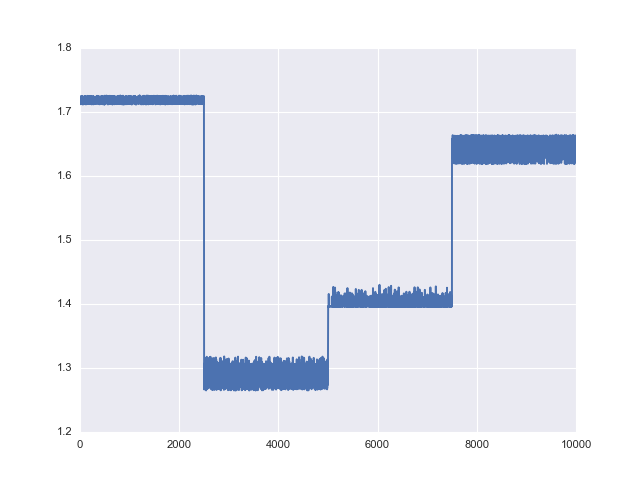

In [70]:
plt.plot(x[:,0,2])

In [23]:
x.shape

(10000, 100, 4)

<IPython.core.display.Javascript object>


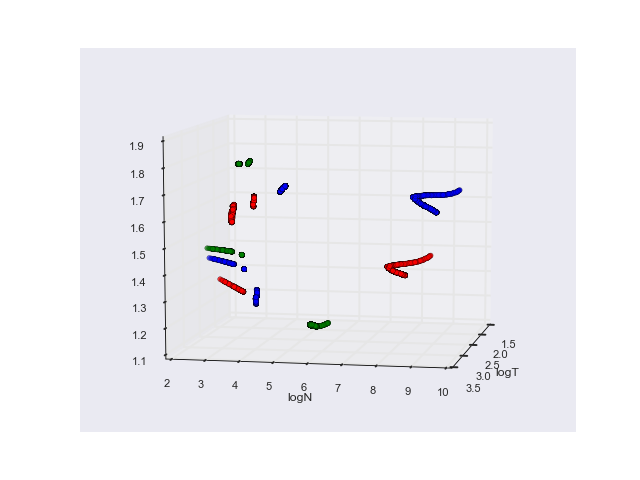

In [84]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(np.log(x[:,0,1]),np.log(x[:,0,0]),x[:,0,2], c='b')
ax.scatter(np.log(x[:,1,1]),np.log(x[:,1,0]),x[:,1,2], c='g')
ax.scatter(np.log(x[:,2,1]),np.log(x[:,2,0]),x[:,2,2], c='r')
ax.set_xlabel('logT')
ax.set_ylabel('logN')

In [59]:
x=fit.extract(['Sigma'])['Sigma']

<IPython.core.display.Javascript object>


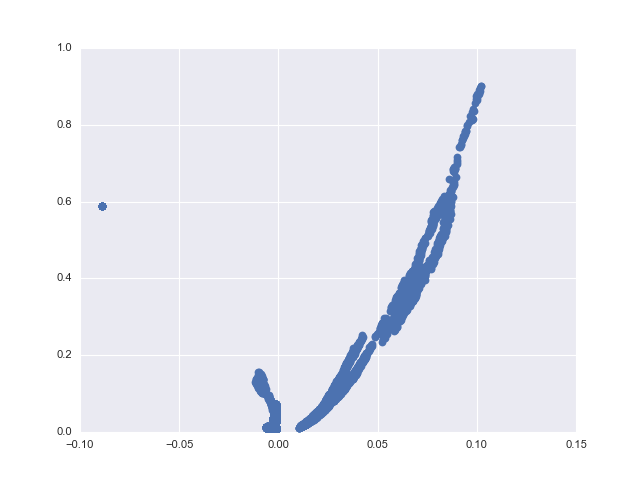

In [64]:
plt.plot(x[:,0,1],x[:,1,1], 'o')

In [75]:
model_code="""
data
{
    int nsrc;
    vector[nsrc] P_100;
    vector[nsrc] P_160;
    vector[nsrc] S_250;
    vector[nsrc] S_350;
    vector[nsrc] S_500;
    vector[nsrc] z;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;
  }





parameters {
  vector<lower=-4,upper=4>[4] alpha[nsrc];
  vector<lower=0.0>[4] S;
  cholesky_factor_corr[4] L;
  vector<lower=0.0>[4] mu;
}

transformed parameters {
 
  vector[4] beta[nsrc]; //N_bb,T,beta,alpha
  vector[nsrc] f_vec_green;//vector of source fluxes
  vector[nsrc] f_vec_red;//vector of source fluxes
  vector[nsrc] f_vec_psw;//vector of source fluxes
  vector[nsrc] f_vec_pmw;//vector of source fluxes
  vector[nsrc] f_vec_plw;//vector of source fluxes
  for (i in 1:nsrc){
    beta[i] = exp(mu + S .* (L * alpha[i]));
    beta[i][3]=log(beta[i][3]);
    beta[i][4]=log(beta[i][4]);
    f_vec_green[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,100.0)*1E-3;
    f_vec_red[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,160.0)*1E-3;
    f_vec_psw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3;
    f_vec_pmw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3;
    f_vec_plw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,500.0)*1E-3;
    
    //L_dust[i]=log10(1.0E-23*LIR(beta[i][1],beta[i][4],beta[i][3],beta[i][2],c,h,k_B)/3.826E33);
}

}
model {
    for (i in 1:nsrc){
        alpha[i] ~ normal(0, 1);
        //print("S250 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3, " S350 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3);
        //print(beta[i]);
        //print(mu);
        P_100[i]~normal(f_vec_green[i],0.01);
        P_160[i]~normal(f_vec_red[i],0.01);
        S_250[i]~normal(f_vec_psw[i],0.01);
        S_350[i]~normal(f_vec_pmw[i],0.01);
        S_500[i]~normal(f_vec_plw[i],0.01);
}
L ~ lkj_corr_cholesky(1.0);
S[1] ~ normal(1.6,0.1);
S[2] ~ normal(0.02,0.01);
S[3] ~ normal(0.3,0.1);
S[4] ~ normal(0.5,0.1);
}
generated quantities {
  matrix[4,4] Omega;
  matrix[4,4] Sigma;
  Omega = multiply_lower_tri_self_transpose(L);
  Sigma = quad_form_diag(Omega, S); 
}
"""

In [384]:
concat = ''.join([open('/Users/pdh21/HELP/XID_plus/stan_models/FIR_module.stan').read(),model_code])
sm = pystan.StanModel(model_code=concat)
data={'nsrc':100,
     'P_100':Lacy['S100'][0:100],
     'P_160':Lacy['S160'][0:100],
     'S_250':Lacy['S250'][0:100],
     'S_350':Lacy['S350'][0:100],
     'S_500':Lacy['S500'][0:100],
     'z':Lacy['Z_OBS'][0:100],
     'mu_prior':[4.0,3.0,1.5,2.0]}
fit=sm.sampling(data=data,iter=1000, chains=4, algorithm='NUTS',control={'adapt_delta':0.9})

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_a61ab387cc8c386398eb71d38c455ac9 NOW.


In [385]:
fit

Inference for Stan model: anon_model_a61ab387cc8c386398eb71d38c455ac9.
4 chains, each with iter=1000; warmup=500; thin=1; 
post-warmup draws per chain=500, total post-warmup draws=2000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
alpha[0,0]        0.21    1.02   1.44  -0.83  -0.71  -0.52   1.29    2.7    2.0 412.94
alpha[1,0]        1.13    1.71   2.42  -3.03  -0.71   2.32   2.73   2.92    2.0    nan
alpha[2,0]       -1.36    1.19   1.68  -3.01  -2.96  -1.68   0.31   0.94    2.0    nan
alpha[3,0]        1.18    1.14   1.61  -1.19   -0.4   1.61   2.66   2.67    2.0    nan
alpha[4,0]       -1.37    0.92    1.3  -2.95  -2.62  -1.49  -0.12   0.45    2.0 194.11
alpha[5,0]        0.44    1.36   1.93  -1.76  -1.48   0.38   2.38   2.76    2.0 1342.0
alpha[6,0]       -0.59    0.89   1.26  -2.09  -1.56  -0.83   0.43   1.39    2.0    nan
alpha[7,0]        0.12    1.59   2.25  -2.54  -2.09   0.02   2.36    3.0    2.0    nan
alpha[8,0]       -0.57    0.91

<IPython.core.display.Javascript object>


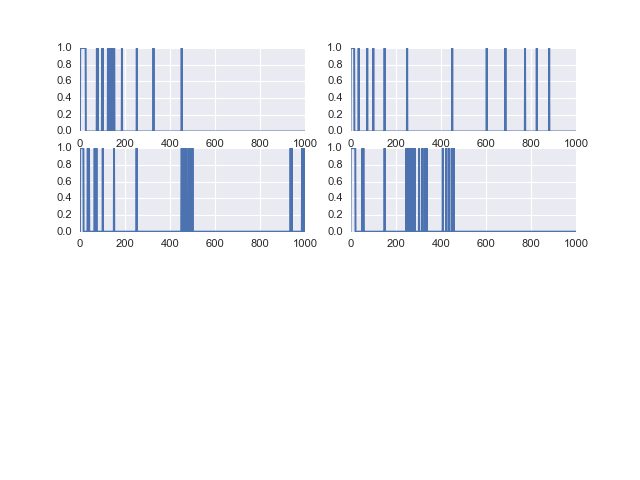

In [386]:
plt.figure()
for i in range(0,4):
    plt.subplot(4,2,i+1)
    plt.plot(fit.get_sampler_params()[i]['divergent__'])

In [387]:
samples=fit.extract(permuted=False,inc_warmup=True)
beta=fit.extract(['beta'], permuted=False,inc_warmup=True)
Sig=fit.extract(['S'], permuted=False,inc_warmup=True)

In [288]:
samples.

(1000, 4, 1353)

In [239]:
print fit.constrained_param_names()
np.array(fit.constrained_param_names())==u'alpha.1.1'

[u'alpha.1.1', u'alpha.2.1', u'alpha.3.1', u'alpha.4.1', u'alpha.5.1', u'alpha.6.1', u'alpha.7.1', u'alpha.8.1', u'alpha.9.1', u'alpha.10.1', u'alpha.11.1', u'alpha.12.1', u'alpha.13.1', u'alpha.14.1', u'alpha.15.1', u'alpha.16.1', u'alpha.17.1', u'alpha.18.1', u'alpha.19.1', u'alpha.20.1', u'alpha.21.1', u'alpha.22.1', u'alpha.23.1', u'alpha.24.1', u'alpha.25.1', u'alpha.26.1', u'alpha.27.1', u'alpha.28.1', u'alpha.29.1', u'alpha.30.1', u'alpha.31.1', u'alpha.32.1', u'alpha.33.1', u'alpha.34.1', u'alpha.35.1', u'alpha.36.1', u'alpha.37.1', u'alpha.38.1', u'alpha.39.1', u'alpha.40.1', u'alpha.41.1', u'alpha.42.1', u'alpha.43.1', u'alpha.44.1', u'alpha.45.1', u'alpha.46.1', u'alpha.47.1', u'alpha.48.1', u'alpha.49.1', u'alpha.50.1', u'alpha.51.1', u'alpha.52.1', u'alpha.53.1', u'alpha.54.1', u'alpha.55.1', u'alpha.56.1', u'alpha.57.1', u'alpha.58.1', u'alpha.59.1', u'alpha.60.1', u'alpha.61.1', u'alpha.62.1', u'alpha.63.1', u'alpha.64.1', u'alpha.65.1', u'alpha.66.1', u'alpha.67.1', u'a

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

<IPython.core.display.Javascript object>


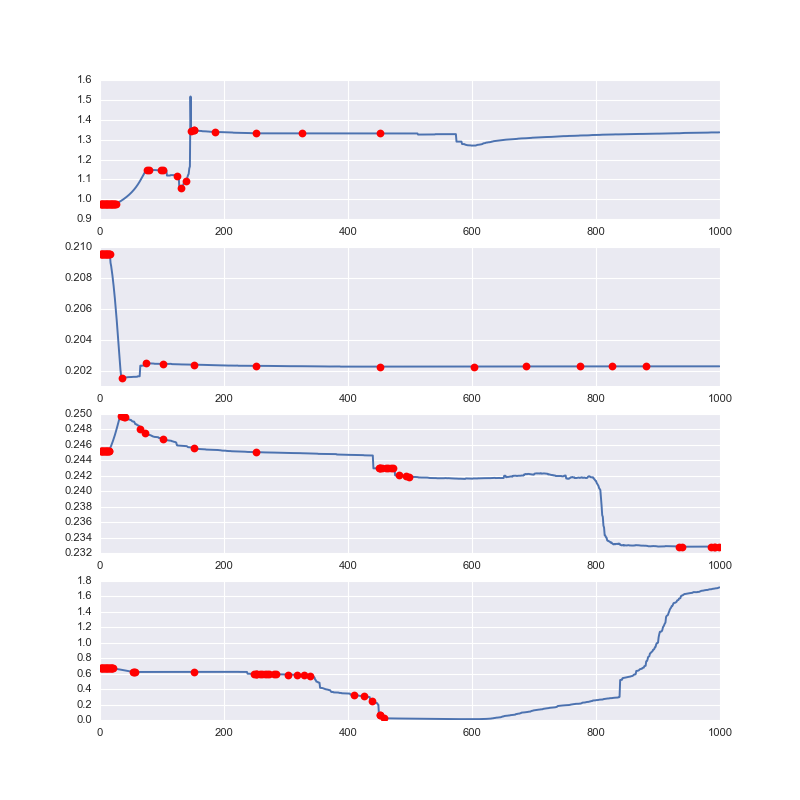

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 420
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 420


In [388]:
plt.figure(figsize=(10,10))
for i in range(0,4):
    plt.subplot(4,1,i+1)
#for i in range(0,4):
#    plt.plot(psw[:,i,0])
    ind=fit.get_sampler_params()[i]['divergent__']>0
    plt.plot(samples[:,i,np.array(fit.constrained_param_names())==u'S.'+str(1)])
    plt.plot(np.arange(0,1000)[ind],samples[ind,i,np.array(fit.constrained_param_names())==u'S.'+str(1)],'ro')


<IPython.core.display.Javascript object>


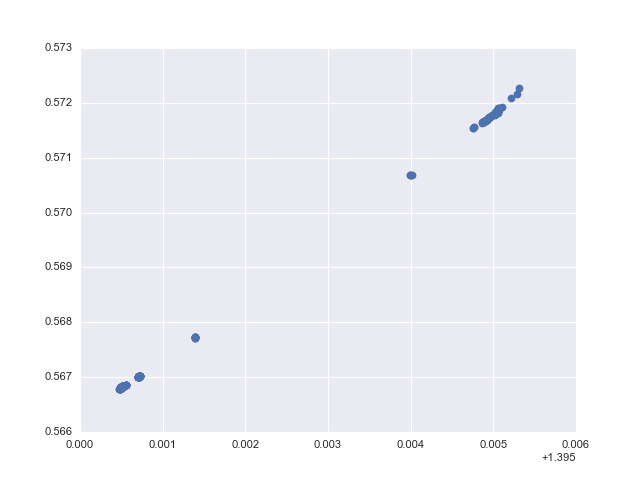

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352


In [287]:
plt.figure()



plt.plot(np.log(samples[500:,0,np.array(fit.flatnames)==u'beta['+str(0)+',3]']),samples[500:,0,np.array(fit.flatnames)==u'S['+str(3)+']'], 'o')




<IPython.core.display.Javascript object>


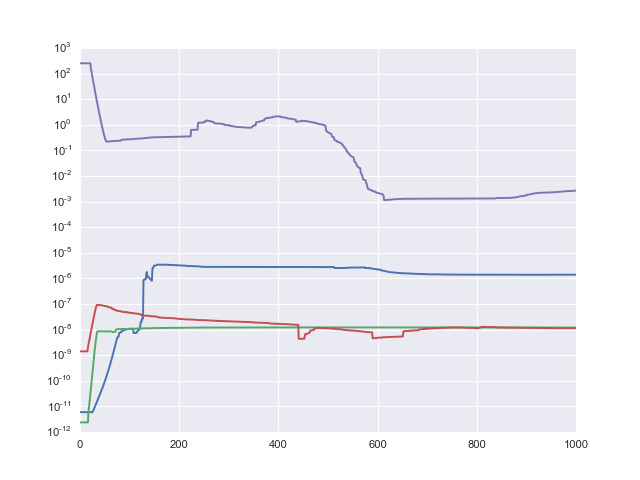

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352
  app.launch_new_instance()


In [389]:
plt.figure()
for i in range(0,4):
    plt.semilogy(samples[:,i,np.array(fit.flatnames)==u'f_vec_psw[1]'])

In [215]:
Sigma[0,0,:]

(1353,)

In [151]:
fit.get_sampler_params()[i]

OrderedDict([(u'accept_stat__',
              array([ 1.        ,  0.5       ,  0.5       ,  0.5       ,  0.5       ,
                      0.5       ,  0.5       ,  0.5       ,  0.5       ,  0.5       ,
                      0.5       ,  0.5       ,  0.5       ,  0.5       ,  0.5       ,
                      0.5       ,  0.5       ,  0.5       ,  0.5       ,  0.5       ,
                      0.5       ,  0.5       ,  0.5       ,  0.5       ,  0.5       ,
                      0.5       ,  0.5       ,  1.        ,  1.        ,  1.        ,
                      1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
                      1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
                      1.        ,  1.        ,  1.        ,  1.        ,  0.75      ,
                      0.25      ,  0.14083777,  0.73682241,  0.84795745,  0.73964331,
                      0.69592457,  0.52930223,  0.7251151 ,  0.91217506,  0.63530369,
                      

In [89]:
x=fit.extract(['beta'])['beta']

In [390]:
ii=0
Sigma=np.empty((11,1000,4))

for i in range(0,4):
    for j in range(0,4):
        if j >= i:
            for s in range(0,1000):
            
                for c in range(0,4):
                    Sigma[ii,s,c]=samples[s,c,np.array(fit.flatnames)==u'Sigma['+str(i)+','+str(j)+']']
                    if (i == 0) and (j == 0):
                        Sigma[10,s,c]=samples[s,c,-1]
            print ii,i,j,c
            ii+=1


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352


0 0 0 3
1 0 1 3
2 0 2 3
3 0 3 3
4 1 1 3
5 1 2 3
6 1 3 3
7 2 2 3
8 2 3 3
9 3 3 3


In [347]:
print samples[:,0,-1]

[ -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27  -2.21959139e+27
  -2.21959139e+27  -2.20141033e+26

In [350]:
labels=[]
for i in range(0,4):
        for j in range(0,4):
            if j >= i:
                labels.append(r'$\sigma_{'+str(i)+','+str(j)+'}$')
labels.append('lp__')

In [361]:
ind=fit.get_sampler_params()[0]['divergent__'][500:]>0
ind.sum

<function sum>

<IPython.core.display.Javascript object>


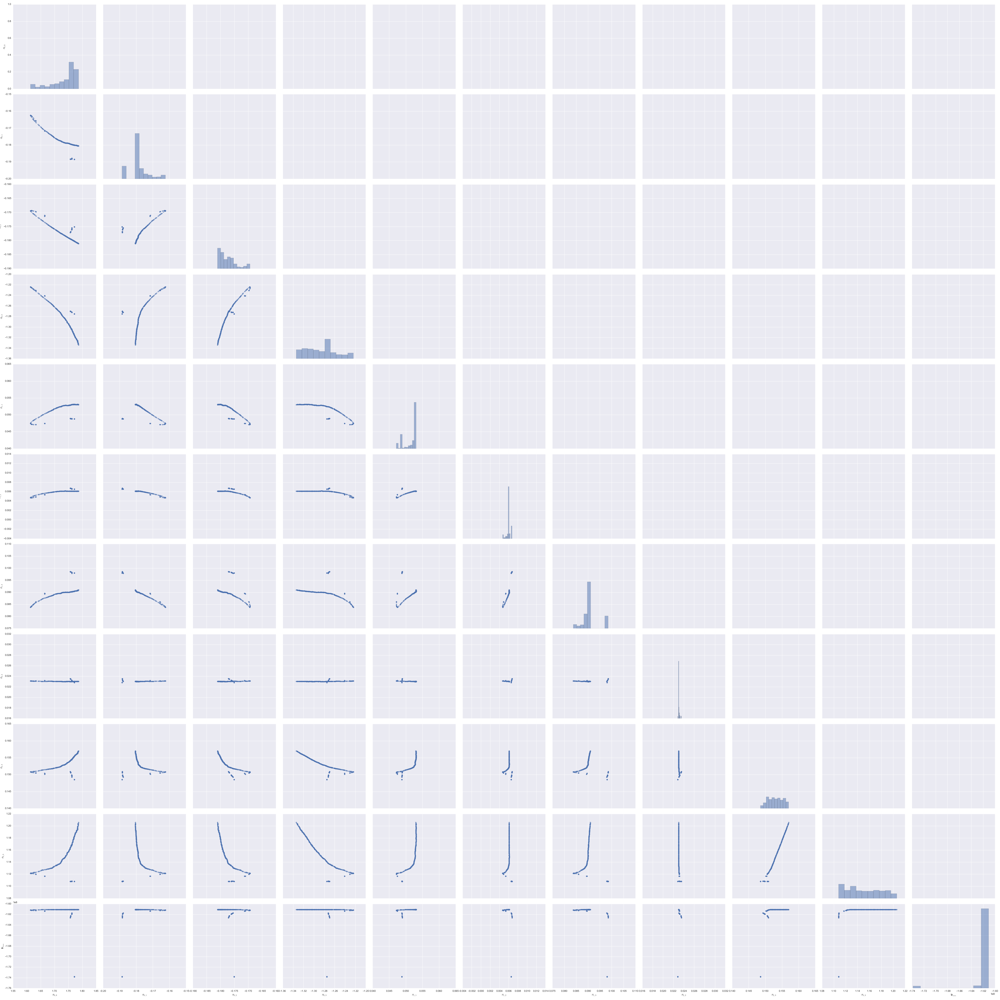

<IPython.core.display.Javascript object>


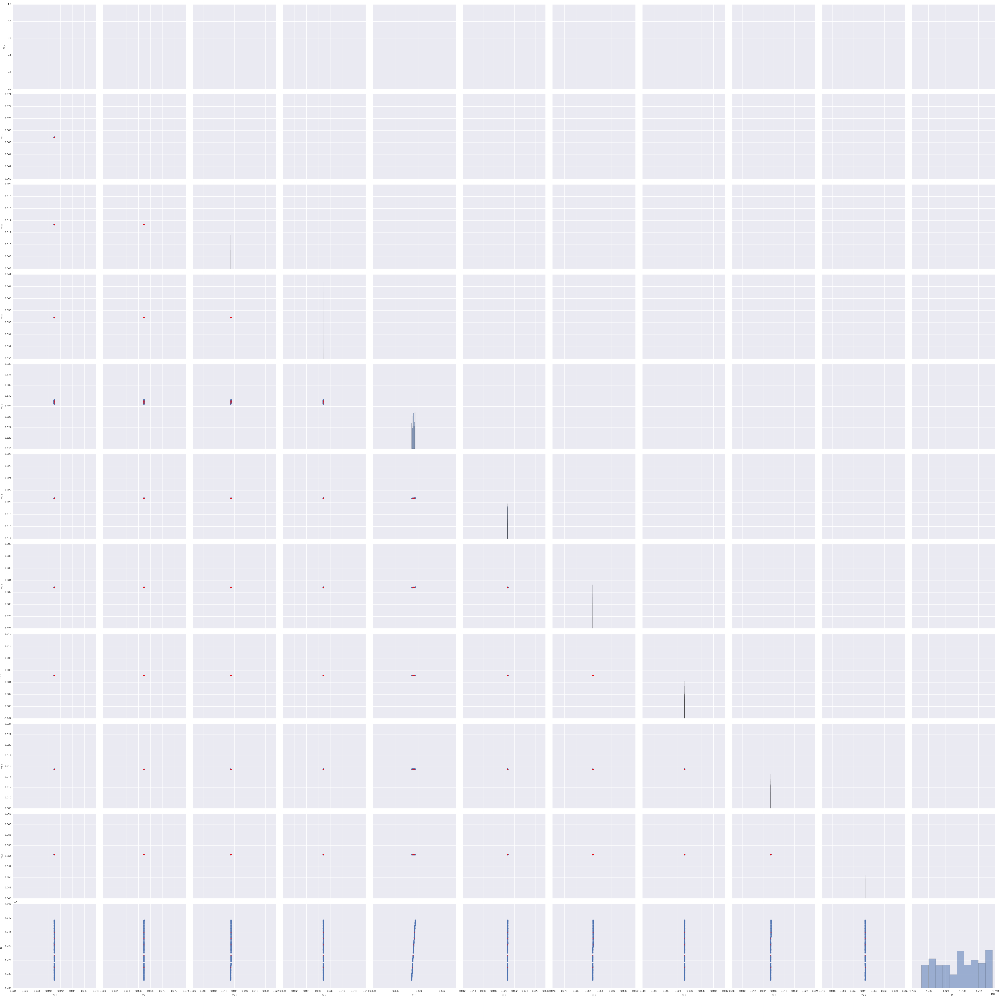

<IPython.core.display.Javascript object>


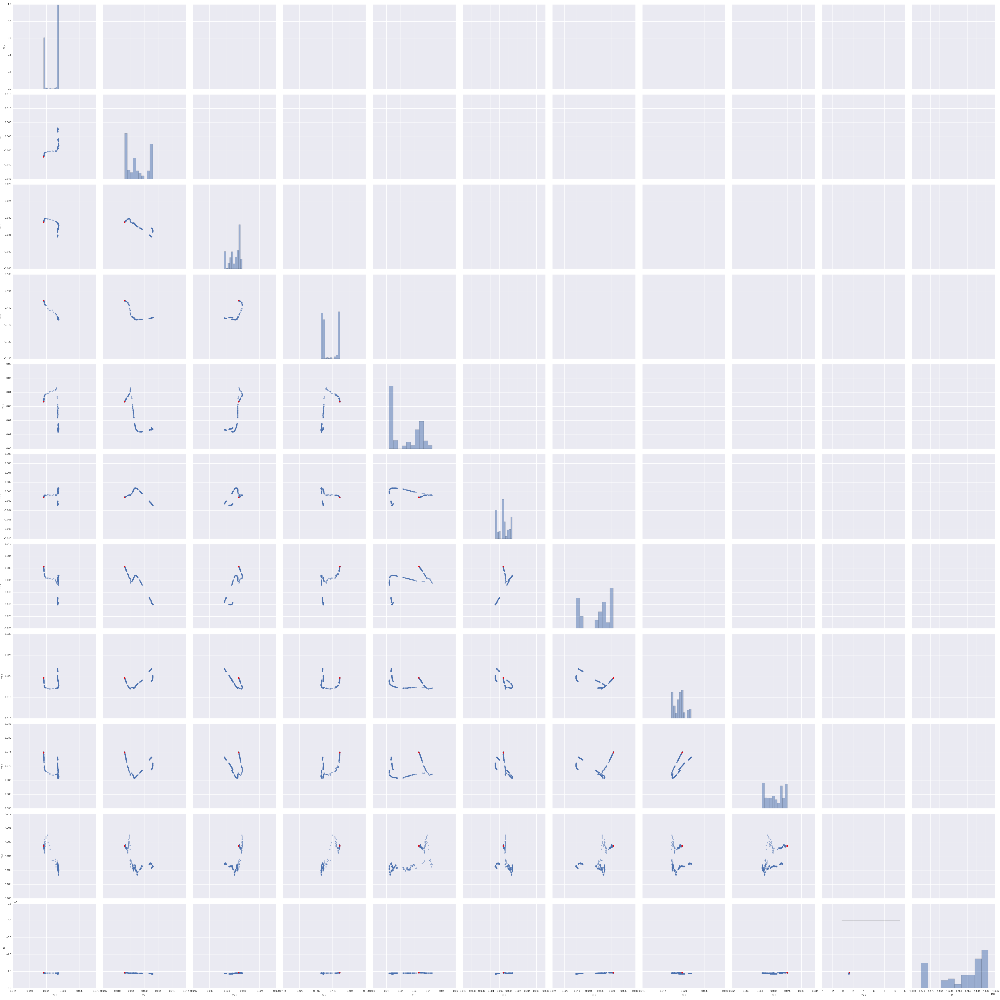

<IPython.core.display.Javascript object>


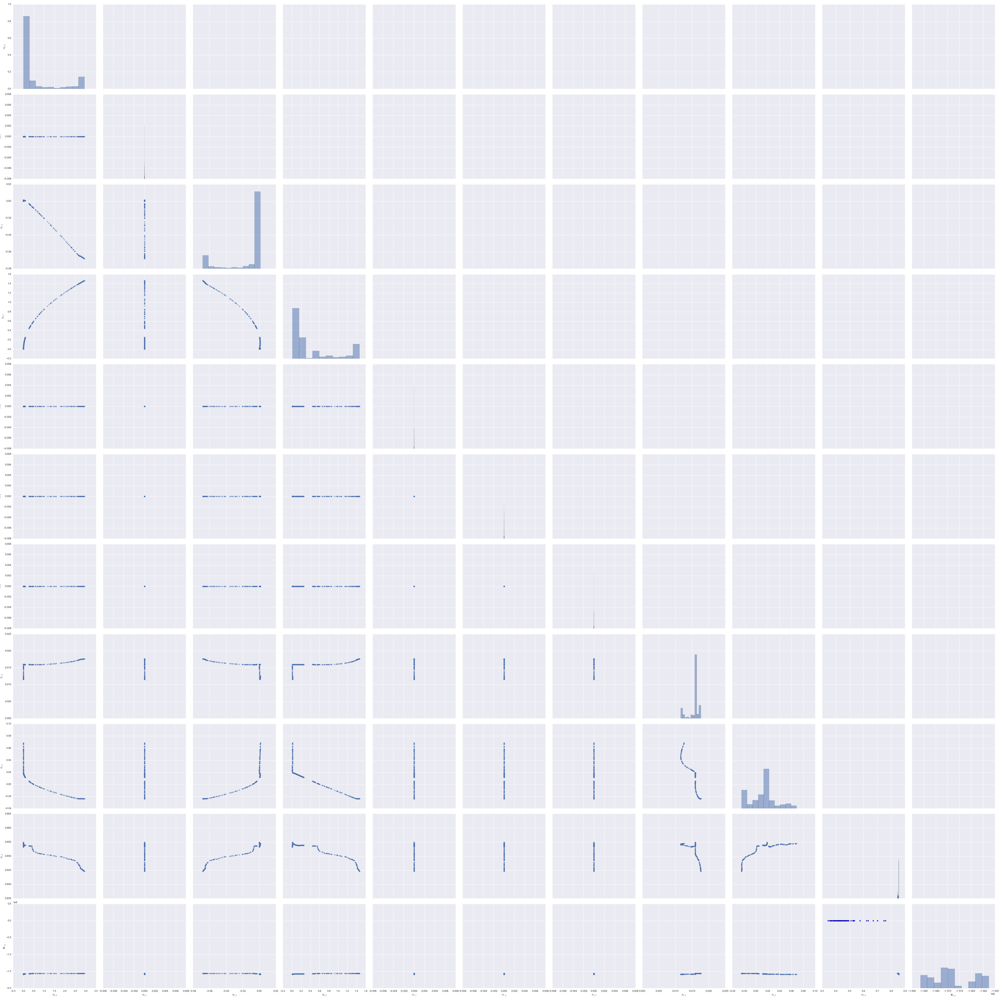

In [391]:
sns.set_context(font_scale=1.5)
import pandas as pd
for c in range(0,4):
    df = pd.DataFrame(Sigma[:,500:,c].reshape(11,500).T,columns=labels)
    g=sns.PairGrid(df,size=5)
    cols=['r','g','c']
    g.map_lower(plt.scatter,alpha=0.5)
    g.map_diag(plt.hist, alpha=0.5)

    ind=fit.get_sampler_params()[c]['divergent__'][500:]>0

    try:
        g.data=pd.DataFrame(Sigma[:,500:,c].reshape(11,500).T[ind,:],columns=labels)
        g.map_lower(plt.scatter, alpha=0.5,color='r')
    except (ValueError):
        pass 
    g.savefig('cov'+str(c)+'.png')
#for i in range(1,4):
    #g.data=pd.DataFrame(Sigma[:,500:,i].reshape(10,500).T,columns=labels)
    #g.map_lower(plt.scatter, alpha=0.5,color=cols[i-1])
    #print cols[i-1]
    #g.map_diag(plt.hist,alpha=0.5)

In [380]:
ind=fit.get_sampler_params()[1]['divergent__'][500:]>0
print ind.sum()
g.data=pd.DataFrame(Sigma[:,500:,1].reshape(11,500).T[ind,:],columns=labels)

3


ValueError: cannot reshape array of size 5500 into shape (11,3)

In [409]:
f_vec=np.empty((3,100,1000,4))
for i in range(0,100):
    f_vec[0,i,:,:]=samples[:,:,np.array(fit.flatnames)==u'f_vec_psw['+str(i)+']'].reshape(1000,4)
    f_vec[1,i,:,:]=samples[:,:,np.array(fit.flatnames)==u'f_vec_pmw['+str(i)+']'].reshape(1000,4)
    f_vec[2,i,:,:]=samples[:,:,np.array(fit.flatnames)==u'f_vec_plw['+str(i)+']'].reshape(1000,4)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352
  app.launch_new_instance()
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 1353 but corresponding boolean dimension is 1352


In [424]:
Lacy['S500'][0:100]

0.30983
0.40618
0.0102681
0.0459506
0.13604
0.187012
0.0408579
0.0665875
8.96614
0.255027
0.0754433


<IPython.core.display.Javascript object>


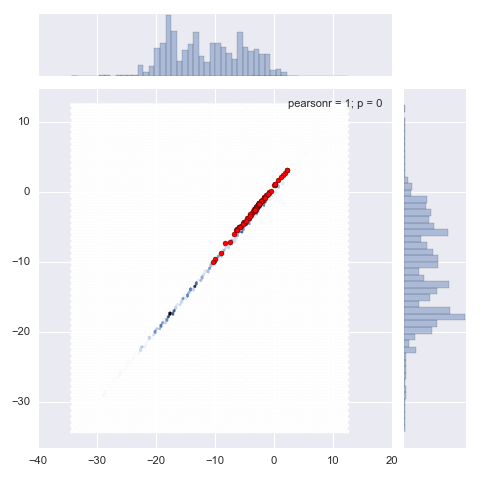

(array([  8.,  19.,  21.,   8.,   5.,   4.,   3.,   2.,   0.]),
 array([-5, -4, -3, -2, -1,  0,  1,  2,  3,  4]),
 <a list of 9 Patch objects>)

In [425]:
ax=sns.jointplot(np.log(f_vec[2,:,:,0].reshape(-1)),np.log(f_vec[2,:,:,0].reshape(-1)), kind="hex")
ax.ax_joint.scatter(np.log(Lacy['S500'][0:100]),np.log(Lacy['S350'][0:100]),c='r')
#ax.scatter(np.log(Lacy['S500'][0:100]),np.log(Lacy['S350'][0:100]))
#plt.scatter(np.log(f_vec[2,:]),np.log(f_vec[1,:]), c='r')

In [365]:
g.savefig('cov.png')

<IPython.core.display.Javascript object>


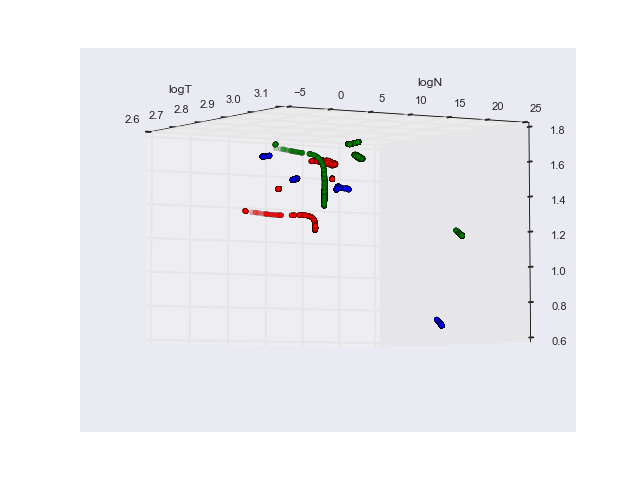

In [90]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(np.log(x[:,0,1]),np.log(x[:,0,0]),x[:,0,2], c='b')
ax.scatter(np.log(x[:,1,1]),np.log(x[:,1,0]),x[:,1,2], c='g')
ax.scatter(np.log(x[:,2,1]),np.log(x[:,2,0]),x[:,2,2], c='r')
ax.set_xlabel('logT')
ax.set_ylabel('logN')

<IPython.core.display.Javascript object>


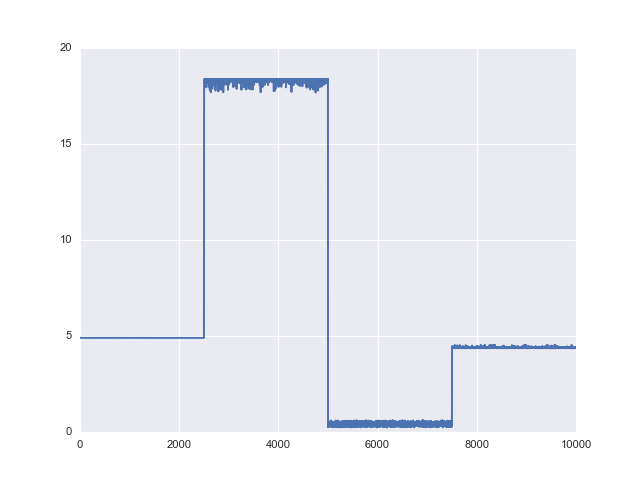

In [94]:
plt.figure()
plt.plot(np.log(x[:,0,0]))

<IPython.core.display.Javascript object>


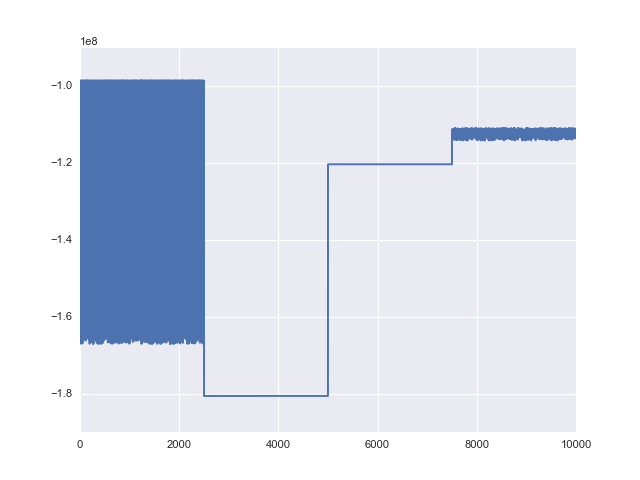

In [101]:
plt.figure()
plt.plot(fit.extract('lp__')['lp__'])

What is the issue? 
It can't fit... chains converging on different solutions. Are some of those chains unphysical?
what parameters to look at? Population parameters better, i.e. Sigma 

<IPython.core.display.Javascript object>


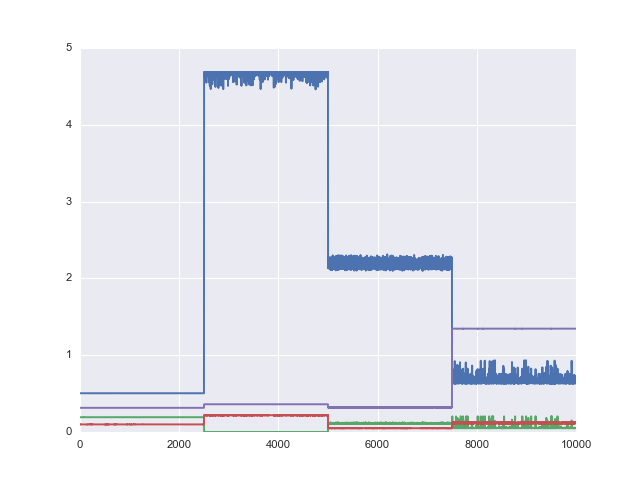

In [103]:
plt.figure()
plt.plot(fit.extract('S')['S'])

(10000, 4, 4)


<IPython.core.display.Javascript object>


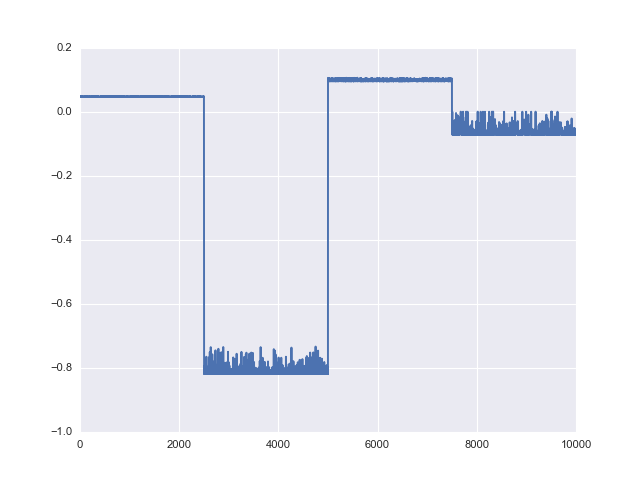

In [119]:
print fit.extract('Sigma')['Sigma'].shape
plt.figure()
plt.plot(fit.extract('Sigma')['Sigma'][:,0,2])

Fluxes are too low, correlation is correct (as I would expect).
What does the joint distribution of T,N, and beta look like? Do I look at it for one object or many?

In [119]:
model_code="""
data
{
    int nsrc;
    vector[nsrc] P_100;
    vector[nsrc] P_160;
    vector[nsrc] S_250;
    vector[nsrc] S_350;
    vector[nsrc] S_500;
    vector[nsrc] z;
}


transformed data {
  real k_B;
  real c;
  real h;
  k_B=1.3806488E-23;
  c=3.0E8;
  h=6.62606957E-34;
  }





parameters {
real<lower=-1.0> N [nsrc]; //N_bb,T,beta,alpha
real<lower=0.0> T[nsrc];
real<lower=1.3,upper=2.0> B[nsrc];
real<lower=1.5,upper=2.5> alpha[nsrc];
}

transformed parameters {
 
  vector[4] beta[nsrc]; //N_bb,T,beta,alpha
  vector[nsrc] f_vec_green;//vector of source fluxes
  vector[nsrc] f_vec_red;//vector of source fluxes
  vector[nsrc] f_vec_psw;//vector of source fluxes
  vector[nsrc] f_vec_pmw;//vector of source fluxes
  vector[nsrc] f_vec_plw;//vector of source fluxes
  
  for (i in 1:nsrc){
    beta[i][1]=exp(N[i]);
    beta[i][2]=exp(T[i]);
    beta[i][3]=B[i];
    beta[i][4]=alpha[i];
    print("beta", beta)
    f_vec_green[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,100.0)*1E-3;
    f_vec_red[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,160.0)*1E-3;
    f_vec_psw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3;
    f_vec_pmw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3;
    f_vec_plw[i]=SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,500.0)*1E-3;
    
    //L_dust[i]=log10(1.0E-23*LIR(beta[i][1],beta[i][4],beta[i][3],beta[i][2],c,h,k_B)/3.826E33);
}

}
model {
    for (i in 1:nsrc){
        //print("S250 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,250.0)*1E-3, " S350 ",SPIRE_obs_no_filt(beta[i][1],beta[i][4],beta[i][3],beta[i][2],z[i],c,h,k_B,350.0)*1E-3);
        //print(beta[i]);
        //print(mu);
        P_100[i]~normal(f_vec_green[i],0.5E-2);
        P_160[i]~normal(f_vec_red[i],0.5E-2);
        S_250[i]~normal(f_vec_psw[i],0.5E-2);
        S_350[i]~normal(f_vec_pmw[i],0.5E-2);
        S_500[i]~normal(f_vec_plw[i],0.5E-2);
}

}

"""

In [120]:
np.log(2.0)

0.69314718055994529

In [121]:
concat = ''.join([open('/Users/pdh21/HELP/XID_plus/stan_models/FIR_module.stan').read(),model_code])
sm = pystan.StanModel(model_code=concat)
data={'nsrc':1,
     'P_100':Lacy['S100'][[0]],
     'P_160':Lacy['S160'][[0]],
     'S_250':Lacy['S250'][[0]],
     'S_350':Lacy['S350'][[0]],
     'S_500':Lacy['S500'][[0]],
     'z':Lacy['Z_OBS'][[0]]}
fit_simp=sm.sampling(data=data,iter=2000, chains=1, algorithm='NUTS')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_0f5ad9de01181aad88877483481ae150 NOW.


In [117]:
data={'nsrc':3,
     'P_100':Lacy['S100'][range(0,3)],
     'P_160':Lacy['S160'][range(0,3)],
     'S_250':Lacy['S250'][range(0,3)],
     'S_350':Lacy['S350'][range(0,3)],
     'S_500':Lacy['S500'][range(0,3)],
     'z':Lacy['Z_OBS'][range(0,3)]}
fit_simp2=sm.sampling(data=data,iter=10000, chains=4, algorithm='NUTS',init=[init_params2(3),init_params2(3),init_params2(3),init_params2(3)])

In [109]:
def init_params2(nsrc):
    dict={}
    
    dict[u'N']=np.full((nsrc),4.0)
    dict[u'T']=np.full((nsrc),2.7)
    dict[u'B']=np.full((nsrc),1.8)
    dict[u'alpha']=np.full((nsrc),2.0)
    return dict
def init_params(nsrc):
    dict={}
    for i in range(0,nsrc):
        dict['N['+str(i)+']']=4.0
        dict['T['+str(i)+']']=2.7
        dict['B['+str(i)+']']=1.6
        dict['alpha['+str(i)+']']=2.0
    return dict

In [118]:
fit_simp2

Inference for Stan model: anon_model_f1765a7f5797ef326221048dbcb05b2d.
4 chains, each with iter=10000; warmup=5000; thin=1; 
post-warmup draws per chain=5000, total post-warmup draws=20000.

                 mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
N[0]             4.06    0.07   1.67   1.38   2.56   4.11   5.37   7.16  565.0    1.0
N[1]             1.19    0.06   0.78   0.17   0.76   1.09   1.38   3.92  159.0   1.03
N[2]             7.64    0.18    4.9  -0.35   3.36   7.51  11.88  15.77  774.0    1.0
T[0]             2.74  8.6e-4   0.02    2.7   2.72   2.74   2.75   2.77  539.0   1.01
T[1]             2.86  1.4e-3   0.02   2.82   2.85   2.86   2.87   2.92  225.0   1.02
T[2]             3.08  2.9e-3   0.08   2.89   3.04   3.09   3.14   3.23  865.0    1.0
B[0]             1.82  2.6e-3   0.06    1.7   1.77   1.82   1.88   1.92  563.0    1.0
B[1]             1.92  2.4e-3   0.03   1.81   1.91   1.92   1.93   1.96  162.0   1.03
B[2]             1.62  6.6e-3   0.1

In [122]:
fit_simp

Inference for Stan model: anon_model_0f5ad9de01181aad88877483481ae150.
1 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=1000.

                 mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
N[0]              3.9    0.14   1.41    1.6   2.61   3.99   5.04   6.36  100.0    1.0
T[0]             2.74  1.7e-3   0.02    2.7   2.72   2.74   2.75   2.76   94.0    1.0
B[0]             1.82  5.3e-3   0.05   1.73   1.78   1.82   1.87   1.91  100.0    1.0
alpha[0]         1.99    0.02   0.29   1.52   1.74    2.0   2.24   2.46  211.0   1.01
beta[0,0]      118.68   13.56 156.38   4.96  13.66   54.2 153.98 580.59  133.0    1.0
beta[0,1]       15.41    0.03   0.26  14.89   15.2  15.46  15.63  15.82   94.0    1.0
beta[0,2]        1.82  5.3e-3   0.05   1.73   1.78   1.82   1.87   1.91  100.0    1.0
beta[0,3]        1.99    0.02   0.29   1.52   1.74    2.0   2.24   2.46  211.0   1.01
f_vec_green[0]   0.18  1.7e-4 3.4e-3 

In [64]:
fit_simp2

Inference for Stan model: anon_model_632831a92ff57da056c7d1b758435f54.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                 mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
alpha[0,0]      -1.54     1.2   1.69  -3.46  -3.18  -2.36   0.13   1.18    2.0   4.85
alpha[1,0]      -1.28    0.56   0.97  -2.65  -2.52  -1.31  -0.65   0.51    3.0   2.16
alpha[0,1]       0.23    1.82   2.58  -3.88   -2.7   1.73    2.5   2.91    2.0  10.66
alpha[1,1]      -0.51    0.68   0.97  -1.95  -1.43  -0.53   0.23   1.28    2.0   2.77
alpha[0,2]      -0.83    0.88   1.24  -2.73  -2.55  -0.46  -0.07   1.24    2.0   2.35
alpha[1,2]       0.56    0.46   1.03  -1.38   0.05   0.08   1.49   2.38    5.0   2.16
alpha[0,3]        0.7    0.76   1.31   -2.0  -0.42   1.23    2.1   2.17    3.0   2.14
alpha[1,3]      -1.34     0.8   1.38  -2.98  -2.98  -1.87  -0.22   1.46    3.0   2.06
S[0]             1.33    1.14   1.61 

In [24]:
samples=fit_simp.extract(permuted=False,inc_warmup=True)


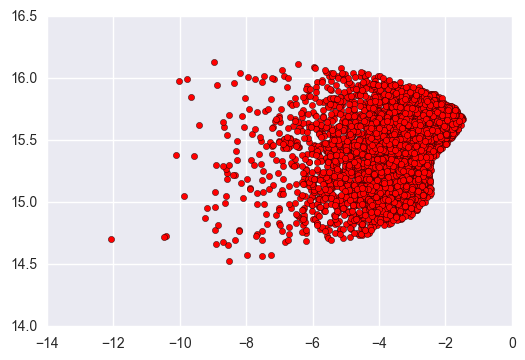

In [57]:
#plt.scatter(samples[:,:,0].reshape(-1),samples[:,:,1].reshape(-1))
plt.scatter(samples[1000:,:,13].reshape(-1),samples[1000:,:,5].reshape(-1), c='r')

In [39]:
def Casey_SED(N_bb,T,beta,alpha,lam):
    b_1=26.68
    b_2=6.246
    b_3=1.905E-4
    b_4=7.243E-5
    k_B=1.3806488E-23
    c=3.0E8
    h=6.62606957E-34
    S_bb=N_bb*np.power(c/(1E-6*lam),beta+3)/(np.exp(h*c/((1E-6*lam)*k_B*T))-1)
    L_a_T=np.power((np.power(b_1+b_2*alpha,-2.0)+(b_3+b_4*alpha)*T),-1.0)
    lam_c=3.0*L_a_T/4.0
    #----Casey 2012 function in table not working------
    #N_pl=N_bb*(1-np.exp(-1.0*(lam_0/lam_c)**beta))*np.power(lam_c,-3.0)/(np.exp(h*c/(lam_c*k_B*T))-1)
    #------Use this instead-------------
    A1 =(c/(lam_c*1E-6))**(beta+3.0)
    A2 = np.exp((h*c)/(1.0E-6*lam_c*k_B*T))-1.0
    B = (lam_c)**alpha
    N_pl = N_bb*A1/(A2*B)
    S_pl=N_pl*np.power(lam,alpha)*np.exp(-1.0*np.power(lam/lam_c,2.0))
    return (S_bb+S_pl)

In [ ]:
print Casey_SED(6000.0,16,16.5,wave)

In [578]:
labels=fit_simp.flatnames
labels.append('lp')
print labels

[u'N[0]', u'N[1]', u'T[0]', u'T[1]', u'B[0]', u'B[1]', u'alpha[0]', u'alpha[1]', u'beta[0,0]', u'beta[1,0]', u'beta[0,1]', u'beta[1,1]', u'beta[0,2]', u'beta[1,2]', u'beta[0,3]', u'beta[1,3]', u'f_vec_green[0]', u'f_vec_green[1]', u'f_vec_red[0]', u'f_vec_red[1]', u'f_vec_psw[0]', u'f_vec_psw[1]', u'f_vec_pmw[0]', u'f_vec_pmw[1]', u'f_vec_plw[0]', u'f_vec_plw[1]', 'lp']


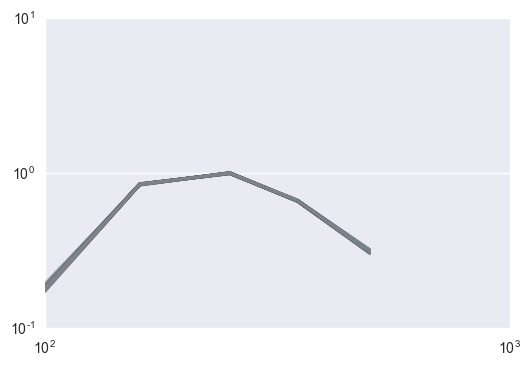

In [38]:
wave=np.array([100.0,160.0,250.0,350.0,500.0])
for i in range(1000,2000):
    plt.loglog(wave,samples[i,0,8:-1], alpha=0.1)



In [37]:
fit_simp.data

{'P_100': <Column name='S100' dtype='float32' length=1>
 0.184557, 'P_160': <Column name='S160' dtype='float32' length=1>
 0.847295, 'S_250': <Column name='S250' dtype='float32' length=1>
 1.00324, 'S_350': <Column name='S350' dtype='float32' length=1>
 0.666443, 'S_500': <Column name='S500' dtype='float32' length=1>
 0.30983, 'nsrc': 1, 'z': <Column name='Z_OBS' dtype='float32' length=1>
 0.100918}

In [579]:
df=pd.DataFrame(samples[np.array(fit_simp.get_sampler_params()[2]['divergent__']>0),2,:],columns=labels)

In [555]:
print samples[fit_simp.get_sampler_params()[0]['divergent__']>0,0,:]

[[  1.61507911e-01   1.85083456e-01   3.50077764e+01   2.44934997e+01
    1.53185170e+00   1.57829692e+00   1.64941581e+00   2.33450830e+00
    1.61507911e-01   1.85083456e-01   3.50077764e+01   2.44934997e+01
    1.53185170e+00   1.57829692e+00   1.64941581e+00   2.33450830e+00
    8.09764602e-05   7.24708755e-05   3.03626470e-05   5.51858748e-05
    1.07444096e-05   2.29671843e-05   4.51990937e-06   1.10810678e-05
    1.61229998e-06   4.35970164e-06  -6.16621874e+16]
 [  1.61507911e-01   1.85083456e-01   3.50077764e+01   2.44934997e+01
    1.53185170e+00   1.57829692e+00   1.64941581e+00   2.33450830e+00
    1.61507911e-01   1.85083456e-01   3.50077764e+01   2.44934997e+01
    1.53185170e+00   1.57829692e+00   1.64941581e+00   2.33450830e+00
    8.09764602e-05   7.24708755e-05   3.03626470e-05   5.51858748e-05
    1.07444096e-05   2.29671843e-05   4.51990937e-06   1.10810678e-05
    1.61229998e-06   4.35970164e-06  -6.16621874e+16]
 [  1.61507911e-01   1.85083456e-01   3.50077764e+01

In [556]:
fit_simp.get_sampler_params()[0]['divergent__']>0

array([False,  True,  True, ..., False, False, False], dtype=bool)

In [581]:
df['f_vec_green[0]']

0     0.014204
1     0.014204
2     0.014204
3     0.014204
4     0.014204
5     0.014204
6     0.014204
7     0.014204
8     0.014204
9     0.014204
10    0.014204
11    0.014204
12    0.014204
13    0.014204
14    0.014204
15    0.014204
16    0.014204
17    0.014204
18    0.014204
19    0.014204
20    0.014204
21    0.014204
22    0.014204
23    0.014204
24    0.014204
25    0.014204
26    0.014204
27    0.014204
28    0.014204
29    0.014204
30    0.014204
31    0.014204
Name: f_vec_green[0], dtype: float64

0.000102971921347


<IPython.core.display.Javascript object>


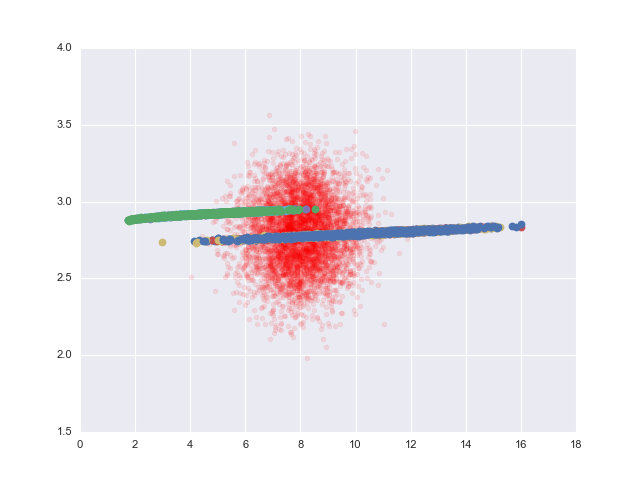

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 27 but corresponding boolean dimension is 26
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 2; dimension is 27 but corresponding boolean dimension is 26


In [496]:

mean=np.array([8,2.8,0.5,0.8])
cov=np.cov(samples[500:,0,1:9:2].T)
print cov[1,1]
cov[1,1]=0.05           
N,T,B,A = np.random.multivariate_normal(mean, cov, 5000).T
plt.figure()
plt.scatter(N,T, alpha=0.1,color='r')
for i in range(0,4):
    plt.plot(samples[1000:,i,np.array(fit_simp.flatnames)==u'N['+str(0)+']'],samples[1000:,i,np.array(fit_simp.flatnames)==u'T['+str(0)+']'], 'o')
    plt.plot(samples[1000:,i,np.array(fit_simp.flatnames)==u'N['+str(1)+']'],samples[1000:,i,np.array(fit_simp.flatnames)==u'T['+str(1)+']'], 'o')

In [495]:
print np.corrcoef(np.log(samples[500:,0,0:8:2].T))
print np.corrcoef(np.log(samples[500:,0,1:9:2].T))

[[ 1.          0.96350084 -0.99948976  0.07616022]
 [ 0.96350084  1.         -0.96584716  0.07930491]
 [-0.99948976 -0.96584716  1.         -0.07675847]
 [ 0.07616022  0.07930491 -0.07675847  1.        ]]
[[ 1.          0.97064225 -0.99986144  0.08201392]
 [ 0.97064225  1.         -0.97153727  0.09907796]
 [-0.99986144 -0.97153727  1.         -0.08127286]
 [ 0.08201392  0.09907796 -0.08127286  1.        ]]


In [506]:
np.arange(0,len(Lacy))[np.max(Lacy['MSTARDOT'])==Lacy['MSTARDOT']], np.arange(0,len(Lacy))[np.min(Lacy['MSTARDOT'])==Lacy['MSTARDOT']]

(array([81425]), array([227872]))

0.0186871254884 0.0600128048146 0.285309112577


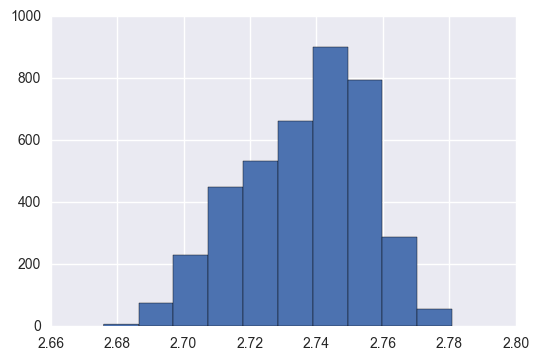

In [73]:
plt.hist(fit_simp.extract()['T'])
print np.std(fit_simp.extract()['T']),np.std(fit_simp.extract()['B']),np.std(fit_simp.extract()['alpha'])